*This notebook guides through the study of the robustness of air traffic networks.*

 # Table of Contents
<div class="toc" style="margin-top: 1em;"><ul class="toc-item" id="toc-level0"><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#Air-route-data" data-toc-modified-id="Air-route-data-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Air route data</a></span><ul class="toc-item"><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#Preprocessing" data-toc-modified-id="Preprocessing-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Preprocessing</a></span></li><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#European-air-traffic-network" data-toc-modified-id="European-air-traffic-network-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>European air traffic network</a></span><ul class="toc-item"><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#Degree-Distribution" data-toc-modified-id="Degree-Distribution-1.2.1"><span class="toc-item-num">1.2.1&nbsp;&nbsp;</span>Degree Distribution</a></span></li><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#Most-connected-airports" data-toc-modified-id="Most-connected-airports-1.2.2"><span class="toc-item-num">1.2.2&nbsp;&nbsp;</span>Most connected airports</a></span></li><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#Robustness" data-toc-modified-id="Robustness-1.2.3"><span class="toc-item-num">1.2.3&nbsp;&nbsp;</span>Robustness</a></span></li></ul></li></ul></li><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#Spatial-Hazard-simulation" data-toc-modified-id="Spatial-Hazard-simulation-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Spatial Hazard simulation</a></span><ul class="toc-item"><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#Impact-of-Eyjafjallajökull-volcano" data-toc-modified-id="Impact-of-Eyjafjallajökull-volcano-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Impact of Eyjafjallajökull volcano</a></span></li><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#Amsterdam-terrorist-attack" data-toc-modified-id="Amsterdam-terrorist-attack-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Amsterdam terrorist attack</a></span></li><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#Impact-of-random-hazards-in-Europe" data-toc-modified-id="Impact-of-random-hazards-in-Europe-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Impact of random hazards in Europe</a></span><ul class="toc-item"><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#%-Routes-closed---%-Airports-closed" data-toc-modified-id="%-Routes-closed---%-Airports-closed-2.3.1"><span class="toc-item-num">2.3.1&nbsp;&nbsp;</span>% Routes closed - % Airports closed</a></span></li><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#Example-of-non-damaging-hazard" data-toc-modified-id="Example-of-non-damaging-hazard-2.3.2"><span class="toc-item-num">2.3.2&nbsp;&nbsp;</span>Example of non damaging hazard</a></span></li><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#Example-of-damaging-hazard" data-toc-modified-id="Example-of-damaging-hazard-2.3.3"><span class="toc-item-num">2.3.3&nbsp;&nbsp;</span>Example of damaging hazard</a></span></li><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#MCS-/-%-Airports-closed" data-toc-modified-id="MCS-/-%-Airports-closed-2.3.4"><span class="toc-item-num">2.3.4&nbsp;&nbsp;</span>MCS / % Airports closed</a></span></li></ul></li></ul></li><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#Comparison-of-different-air-traffic-network" data-toc-modified-id="Comparison-of-different-air-traffic-network-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Comparison of different air traffic network</a></span><ul class="toc-item"><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#US-network" data-toc-modified-id="US-network-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>US network</a></span></li><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#Random-graph" data-toc-modified-id="Random-graph-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Random graph</a></span></li><li><span><a href="http://localhost:8888/notebooks/ngsa-air-routes-analysis/code/exploration_europe.ipynb#Robustness-comparison" data-toc-modified-id="Robustness-comparison-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Robustness comparison</a></span></li></ul></li></ul></div>

In [1]:
# Import modules and functions used in this notebook
import matplotlib.pyplot as plt 
import networkx as nx
import pandas as pd
import numpy as np
import random
import os

from utils import find_key, plot_distribution, plot_robustness, preprocess,\
                  create_features_for_plot
from PyGeoTools.geolocation import GeoLocation
from spatial_hazards import SpatialHazards
from tqdm import tqdm


In [2]:
# Style used for the plots
%matplotlib inline
plt.style.use("ggplot")

In [3]:
# Reload functions in the scripts
%load_ext autoreload
%autoreload 2

In [4]:
# Path to the data
path_data = "../data/"

# Air route data

We have used the data from [OpenFlights](https://openflights.org/data.html), consisting in a **Route** and **Airport** tables. The variables present in the respective tables are described below:
and 

**ROUTES DATASET**
- **Airline** 2-letter (IATA) or 3-letter (ICAO) code of the airline.
- **Airline ID** Unique OpenFlights identifier for airline (see Airline).
- **Source airport** 3-letter (IATA) or 4-letter (ICAO) code of the source airport.
- **Source airport ID** Unique OpenFlights identifier for source airport (see Airport)
- **Destination airport** 3-letter (IATA) or 4-letter (ICAO) code of the destination airport.
- **Destination airport ID** Unique OpenFlights identifier for destination airport (see Airport)
- **Codeshare** "Y" if this flight is a codeshare (that is, not operated by Airline, but another carrier), empty otherwise.
- **Stops** Number of stops on this flight ("0" for direct)
- **Equipment** 3-letter codes for plane type(s) generally used on this flight, separated by spaces


**AIRPORTS DATASET**
- **Airport ID** Unique OpenFlights identifier for this airport.
- **Name** Name of airport. May or may not contain the City name.
- **City** Main city served by airport. May be spelled differently from Name.
- **Country** Country or territory where airport is located. See countries.dat to cross-reference to ISO 3166-1 codes.
- **IATA** 3-letter IATA code. Null if not assigned/unknown.
- **ICAO** 4-letter ICAO code. Null if not assigned.
- **Latitude**Decimal degrees, usually to six significant digits. Negative is South, positive is North.
- **Longitude** Decimal degrees, usually to six significant digits. Negative is West, positive is East.
- **Altitude** In feet.
- **Timezone** Hours offset from UTC. Fractional hours are expressed as decimals, eg. India is 5.5.
- **DST** Daylight savings time. One of E (Europe), A (US/Canada), S (South America), O (Australia), Z (New Zealand), N (None) or U (Unknown). See also: Help: Time
- **Tz database time zone** Timezone in "tz" (Olson) format, eg. "America/Los_Angeles".
- **Type** Type of the airport. Value "airport" for air terminals, "station" for train stations, "port" for ferry terminals and "unknown" if not known. In airports.csv, only type=airport is included.
- **Source** Source of this data. "OurAirports" for data sourced from OurAirports, "Legacy" for old data not matched to OurAirports (mostly DAFIF), "User" for unverified user contributions. In airports.csv, only source=OurAirports is included.

In [5]:
# New variable names
col_names_routes = ["airline", "id_airline", "source_airport", 
                    "id_source_airport", "destination_airport",
                    "id_destination_airport", "codeshare",
                    "stops", "equipment"]

col_names_airports = ["id_airport", "name", "city", 
                      "country", "IATA", "ICAO", "latitude",
                      "longitude", "altitude", "tz", "dst", "tz_db",
                      "type", "source"]

In [6]:
# Read the two tables 
df = pd.read_table(os.path.join(path_data, "routes.dat"),
                   sep=",", names=col_names_routes)

df_airports = pd.read_table(os.path.join(path_data, "airports.dat"),
                   sep=",", names=col_names_airports, index_col=0)

In [7]:
df.head()

,airline,id_airline,source_airport,id_source_airport,destination_airport,id_destination_airport,codeshare,stops,equipment
0,2B,410,AER,2965,KZN,2990,NaN,0,CR2
1,2B,410,ASF,2966,KZN,2990,NaN,0,CR2
2,2B,410,ASF,2966,MRV,2962,NaN,0,CR2
3,2B,410,CEK,2968,KZN,2990,NaN,0,CR2
4,2B,410,CEK,2968,OVB,4078,NaN,0,CR2


In [8]:
df_airports.head()

,name,city,country,IATA,ICAO,latitude,longitude,altitude,tz,dst,tz_db,type,source
id_airport,,,,,,,,,,,,,
1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports
3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports


## Preprocessing

In this section, we limit the study to the **European air traffic network**. We only keep the airports inside Europe and the flights connecting one European country to the other. 

In [9]:
# European countries considered 
countries_eur = ["Albania", "Andorra", "Armenia", "Austria", "Azerbaijan", "Belarus", 
                 "Belgium", "Bosnia and Herzegovina", "Bulgaria", "Croatia", "Cyprus", 
                 "Czech Republic", "Denmark", "Estonia", "Finland", "France", "Georgia", 
                 "Germany", "Greece", "Hungary", "Iceland", "Ireland", "Italy", 
                 "Kazakhstan", "Kosovo", "Latvia", "Liechtenstein", "Lithuania", 
                 "Luxembourg", "Macedonia", "Malta", "Moldova", "Monaco", "Montenegro", 
                 "Netherlands", "Norway", "Poland", "Portugal", "Romania", 
                 "Russia", "San Marino", "Serbia", "Slovakia", "Slovenia", 
                 "Spain", "Sweden", "Switzerland", "Turkey", "Ukraine", "United Kingdom"]

# Only keep the European airports in the Aiports table
df_airports_eur = df_airports[df_airports["country"].isin(countries_eur)]

# Unique airports in Europe
airports_eur = list(df_airports_eur['IATA'].unique())
print("There are {} airports in Europe".format(len(airports_eur)))

There are 1071 airports in Europe


In [10]:
# Only keep the routes connecting one European country to another
df_eur = df[(df['source_airport'].isin(airports_eur)) 
            & (df['destination_airport'].isin(airports_eur))]


The dataset provider indicates that *"the special value \N is used for "NULL" to indicate that no value is available".* We decided to delete the routes for which the id of the source airport or the destination airport is NULL.

In [11]:
# Counting the number of missing id source airports and missing id destination airports
print("#Missing Source IDs: {}".format(len(df_eur[df_eur.id_source_airport == "\\N"])))
print("#Missing Source IDs: {}".format(len(df_eur[df_eur.id_destination_airport == "\\N"])))

#Missing Source IDs: 0
#Missing Source IDs: 0


> All the European data is available, no route will be deleted.

As we do not consider airlines or equipments, we delete duplicate lines (i.e. with same id_source_airport AND id_source_airport). The following table shows the number the number of airlines that connect a source airport and a destination airport:

In [12]:
df_eur.groupby(["id_source_airport", "id_destination_airport"]).count()["airline"]

id_source_airport  id_destination_airport
1051               1054                      2
                   1055                      1
                   1056                      2
                   1057                      1
                   1216                      2
                   1218                      3
                   1229                      3
                   1418                      1
                   1423                      2
                   1524                      1
                   1525                      1
                   1550                      1
                   1555                      1
                   1562                      1
                   1612                      2
                   1613                      2
                   1678                      2
                   302                       1
                   304                       1
                   337                       1
                  

In [13]:
# Example 
df_eur[((df_eur.id_source_airport == "1051") & (df_eur.id_destination_airport == "1054"))]

,airline,id_airline,source_airport,id_source_airport,destination_airport,id_destination_airport,codeshare,stops,equipment
43722,NT,1539,FUE,1051,LPA,1054,NaN,0,AT7
45999,PM,5016,FUE,1051,LPA,1054,NaN,0,SWM AT4


The deletion of duplicate lines, and routes with NULL values is done using the function `utils.preprocess`.

In [14]:
# Preprocess the European Routes
df_eur_processed = preprocess(df_eur)
df_eur_processed.shape

(11835, 2)

In [15]:
# Unique airports in Europe 
airport_eur_iata_ids = list(df_eur_processed.source_airport\
                            .append(df_eur_processed.destination_airport).unique())

n_unique_airports = len(airport_eur_iata_ids)
print("There are {} unique airports in Europe".format(n_unique_airports))

There are 662 unique airports in Europe


> Notice that the number of European airports in the Airports table was $1071$. Thus, there are $409$ airports for which there are no routes, or for which the routes are only outside Europe.



We will reduce the Airports table to these **662 airports**:

In [16]:
df_airports_eur = df_airports_eur[df_airports_eur.IATA.isin(airport_eur_iata_ids)]
df_airports_eur.shape

(662, 13)

## European air traffic network

In this section, we build the European air traffic network from the **Routes** table.

In [17]:
# Edges of the network (IATA codes)
arr_edges = np.array(df_eur_processed)

# Show five routes
arr_edges[:5]

array([['AER', 'KZN'],
       ['ASF', 'KZN'],
       ['ASF', 'MRV'],
       ['CEK', 'KZN'],
       ['CEK', 'OVB']], dtype=object)

In [18]:
# Directed graph
G_dir = nx.DiGraph()
G_dir.add_edges_from(arr_edges)

n_edges_dir = len(G_dir.edges())
print("There are {} uni-directional routes".format(n_edges_dir))

There are 11835 uni-directional routes


In [19]:
# Undirected graph
G = nx.Graph()
G.add_edges_from(arr_edges)

n_edges = len(G.edges())
print("There are {} bi-directional routes".format(n_edges))

There are 5984 bi-directional routes


In [20]:
# Basic statistics of the directed network
print("--> Basic statistics of the directed European air traffic network")
print("#Routes: {}".format(df_eur_processed.shape[0]))
print("#Unique Source Airports: {}".format(df_eur_processed.source_airport.nunique()))
print("#Unique Target Airports: {}".format(df_eur_processed.destination_airport.nunique()))
nodes = np.unique(np.concatenate([df_eur_processed.source_airport, df_eur_processed.destination_airport]))
print("#Nodes: {}".format(len(nodes)))

--> Basic statistics of the directed European air traffic network
#Routes: 11835
#Unique Source Airports: 661
#Unique Target Airports: 662
#Nodes: 662


### Degree Distribution

In [21]:
# {(id_airport, in_degree)} dict
in_degrees_dic = dict(G_dir.in_degree())
# List of in_degrees
in_degrees_list = in_degrees_dic.values()

# {(id_airport, out_degree)} dict
out_degrees_dic = dict(G_dir.out_degree())
# List of out_degrees
out_degrees_list = out_degrees_dic.values()

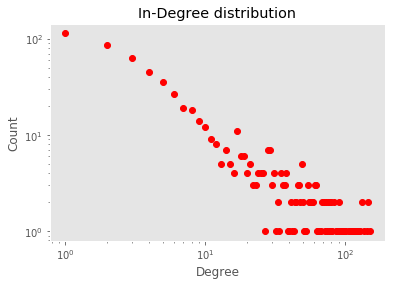

In [22]:
plot_distribution(G_dir, what="in", title="In-Degree distribution")

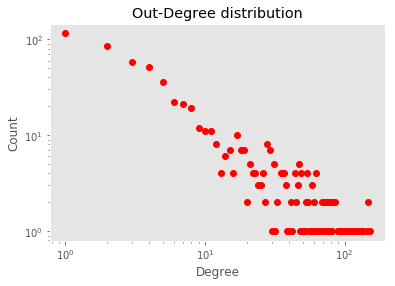

In [23]:
plot_distribution(G_dir, what="out", title="Out-Degree distribution")

### Most connected airports

We show which airports are the most connected in Europe in terms of **incoming** and **outgoing** flights.

In [26]:
max_in = max(in_degrees_list)
max_out = max(out_degrees_list)

# Find node id with degrees max_in and max_out
max_in_nodes = find_key(in_degrees_dic, max_in)
max_out_nodes = find_key(out_degrees_dic, max_out)

print("Max in-degree (nodes {}): {}".format(max_in_nodes, max_in))
print("Max out-degree (nodes {}): {}".format(max_out_nodes, max_out))

Max in-degree (nodes ['AMS']): 150
Max out-degree (nodes ['AMS']): 151


In [27]:
# n biggest airports to show 
n_biggest = 6

In [28]:
# Use the IATA code as the index
df_airports_eur.index = df_airports_eur.IATA

In [29]:
# "biggest" airports regarding out_degree
df_eur_processed.groupby("source_airport").count()\
        .sort_values("destination_airport", ascending=False)[:n_biggest]\
        .join(df_airports_eur)\
        [["destination_airport", "name", "city", "country"]]\
        .rename(columns= {"destination_airport": "Number of destinations"})

,Number of destinations,name,city,country
source_airport,,,,
AMS,151,Amsterdam Airport Schiphol,Amsterdam,Netherlands
STN,146,London Stansted Airport,London,United Kingdom
MUC,146,Munich International Airport,Munich,Germany
DME,144,Domodedovo International Airport,Moscow,Russia
BCN,136,Barcelona International Airport,Barcelona,Spain
FRA,134,Frankfurt am Main International Airport,Frankfurt,Germany


In [30]:
# "biggest" airports regarding in_degree
df_eur_processed.groupby("destination_airport").count()\
        .sort_values("source_airport", ascending=False)[:n_biggest]\
        .join(df_airports_eur)[["source_airport", "name", "city", "country"]]\
        .rename(columns= {"source_airport": "Number of incoming flights"})

,Number of incoming flights,name,city,country
destination_airport,,,,
AMS,150,Amsterdam Airport Schiphol,Amsterdam,Netherlands
DME,145,Domodedovo International Airport,Moscow,Russia
STN,145,London Stansted Airport,London,United Kingdom
MUC,144,Munich International Airport,Munich,Germany
BCN,136,Barcelona International Airport,Barcelona,Spain
IST,133,Atatürk International Airport,Istanbul,Turkey


### Robustness

Being a scale-free network, we assess the vulnerability of the European air traffic network to targeted attacks, and the robustness to random failures. We removed a fraction of nodes between $0\%$ and $20\%$.

In [31]:
gcc = max(nx.connected_component_subgraphs(G), key=len)
(props, Y_random, Y_target) = create_features_for_plot(0, 0.2, 10, gcc)

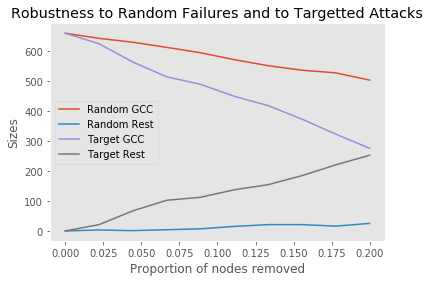

In [32]:
plot_robustness(props, Y_random, Y_target)

# Spatial Hazard simulation

## Impact of Eyjafjallajökull volcano

We simulate the impact of the volcano (located at $(63.628303°, -19.605352°)$) on the European air traffic network (here modeled as an undirected graph). We look at the impact as the radius of the covered area grows (ash cloud). 

In [33]:
spatial_hazards = SpatialHazards(df_airports_eur, df_eur_processed)

Number of initial airports: 662
Number of initial routes: 5984
Number of airports in the GCC initially: 658


In [34]:
# Latitude and lagitude of the volcano in decimal degrees
lat_volcano = 63.628303
long_volcano = -19.605352

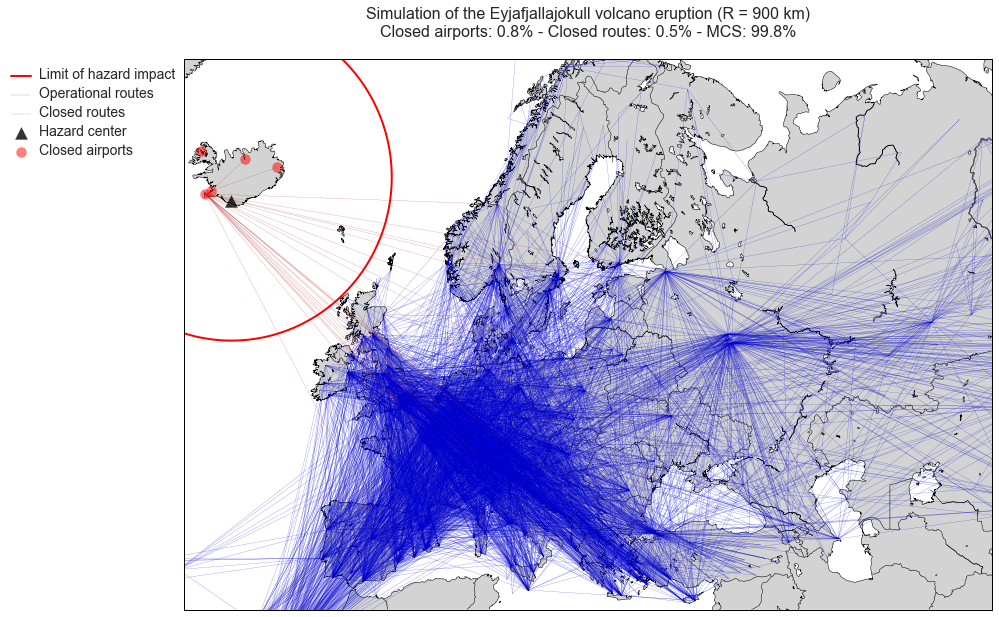

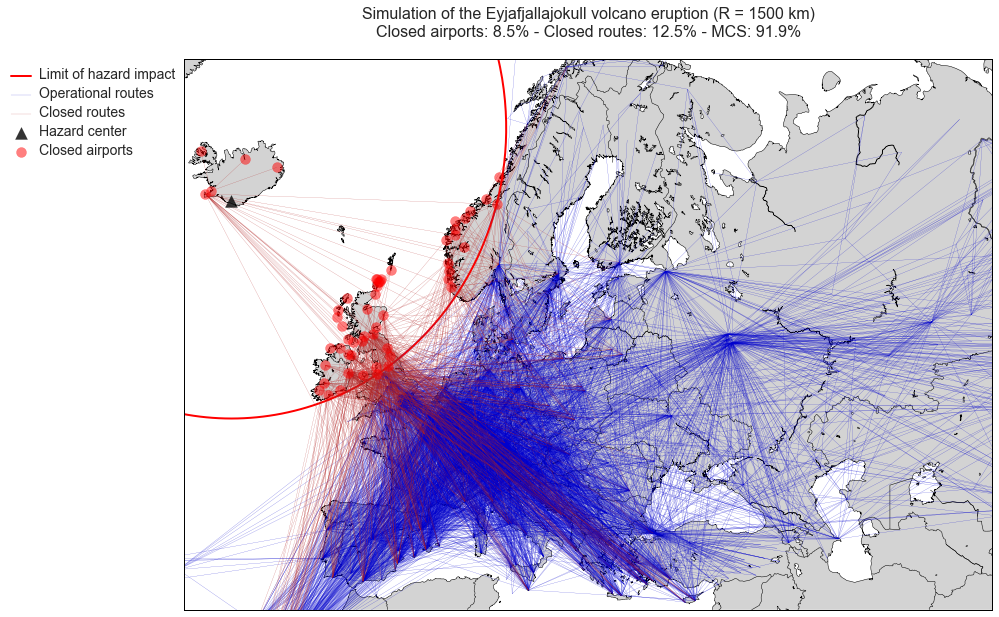

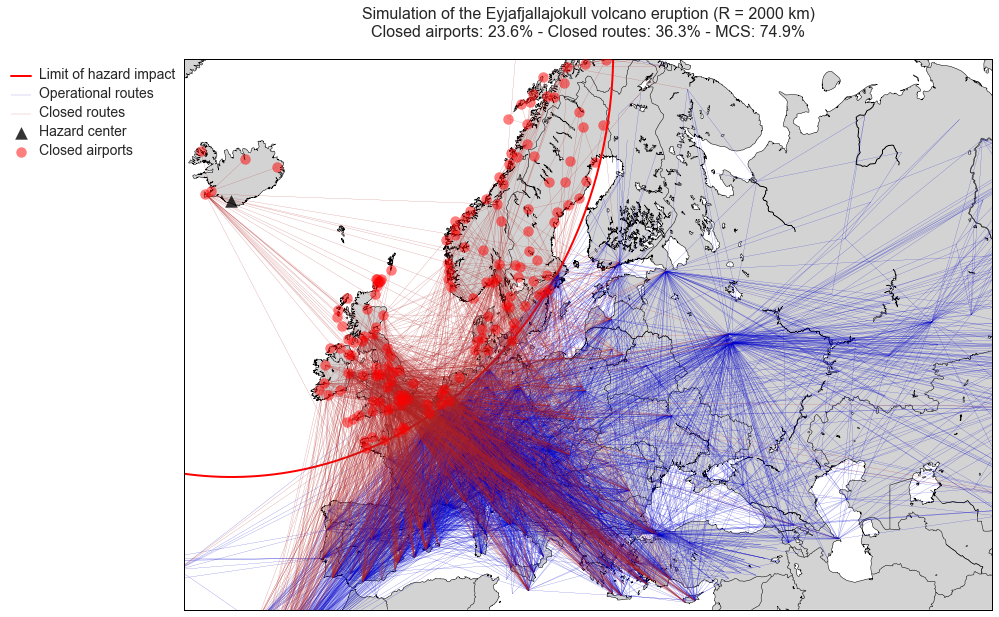

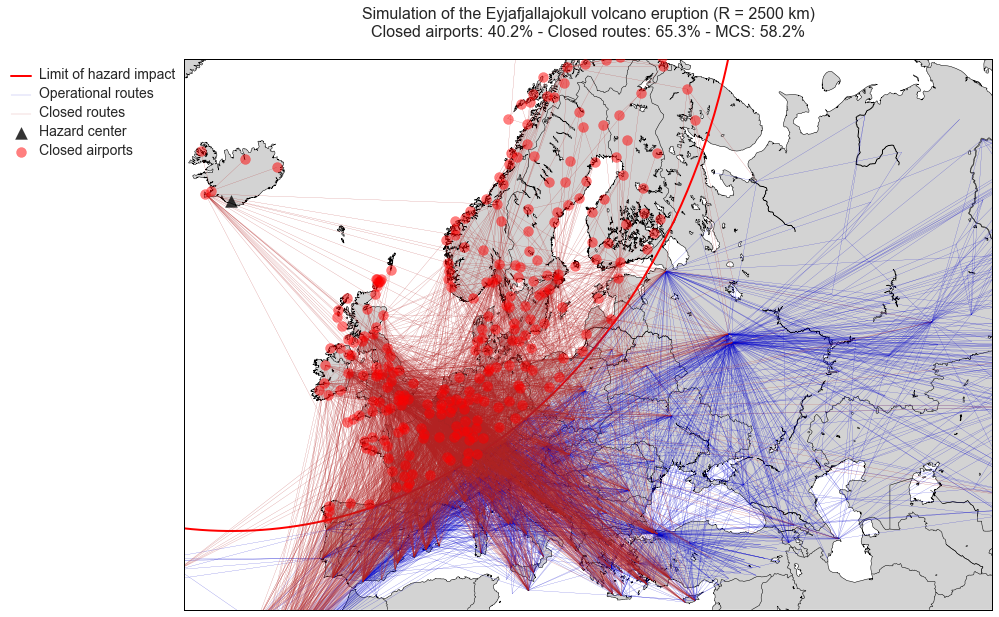

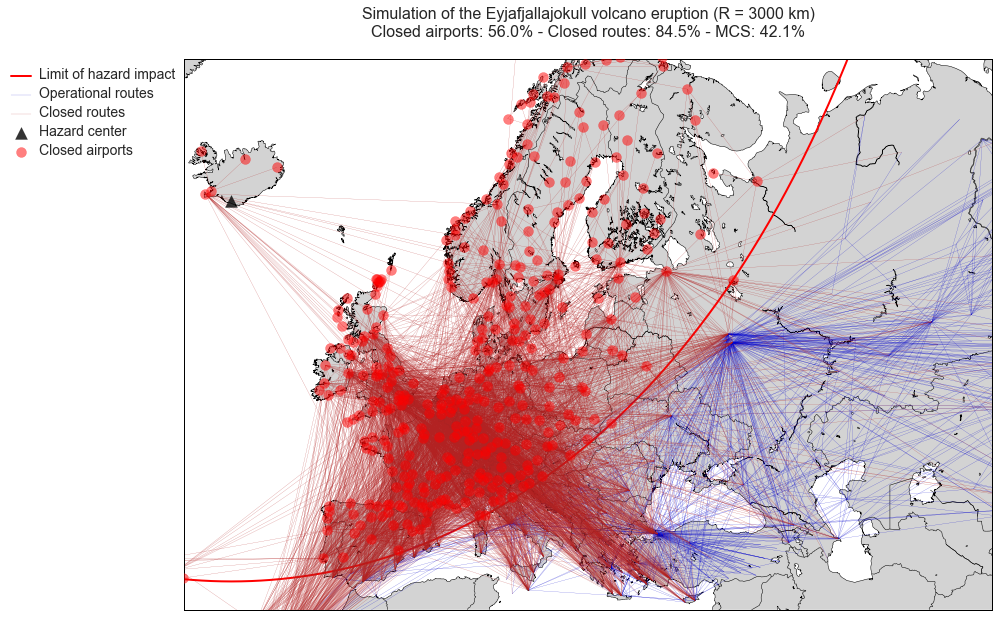

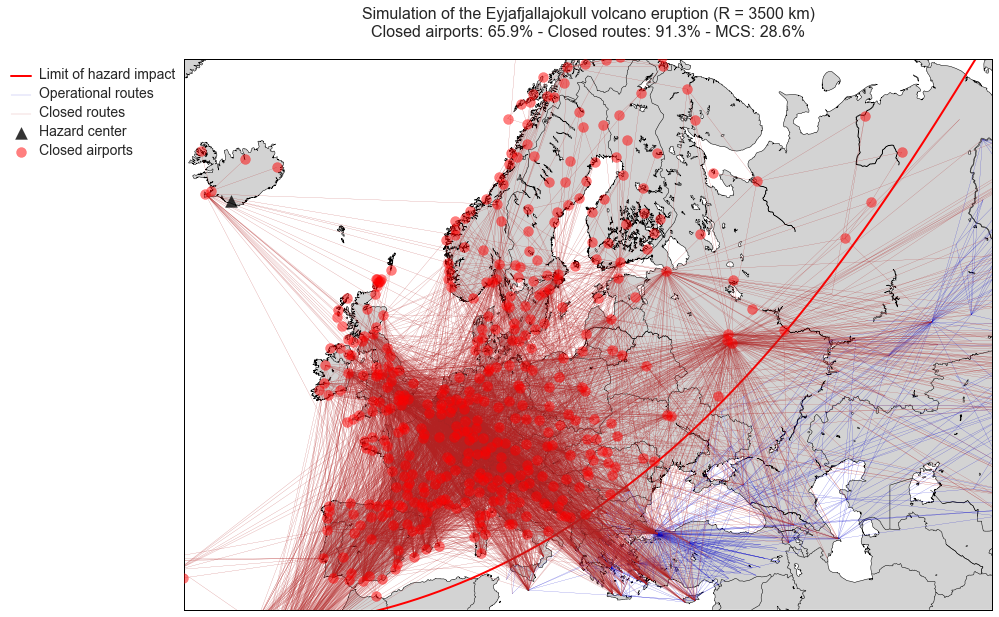

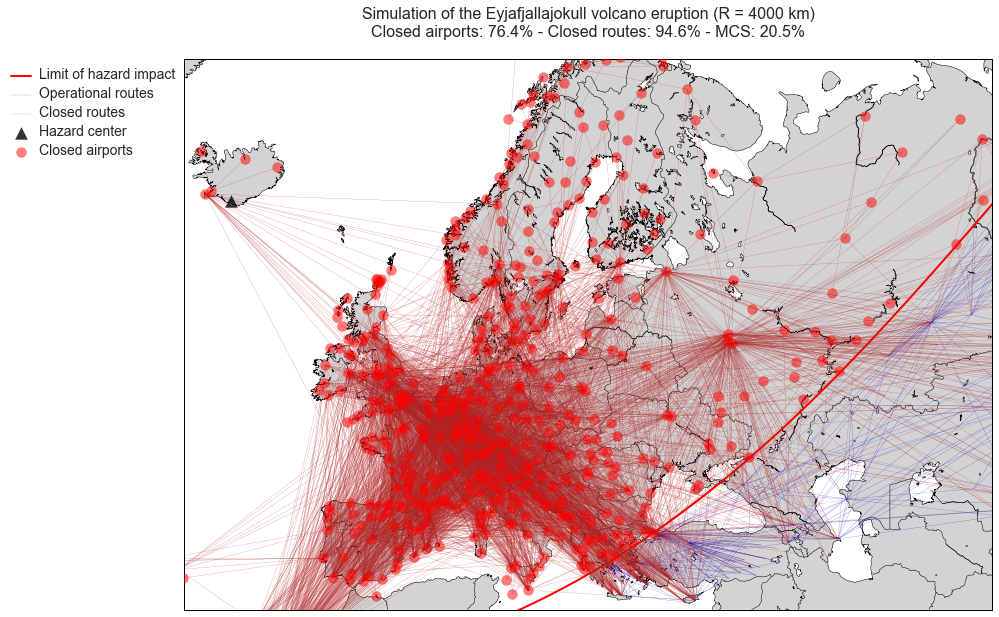

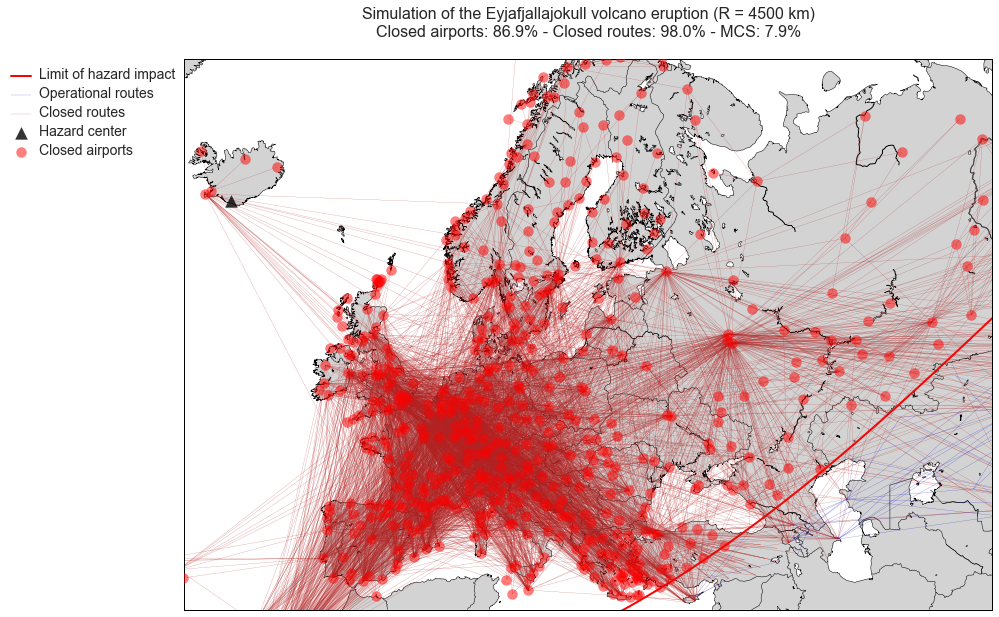

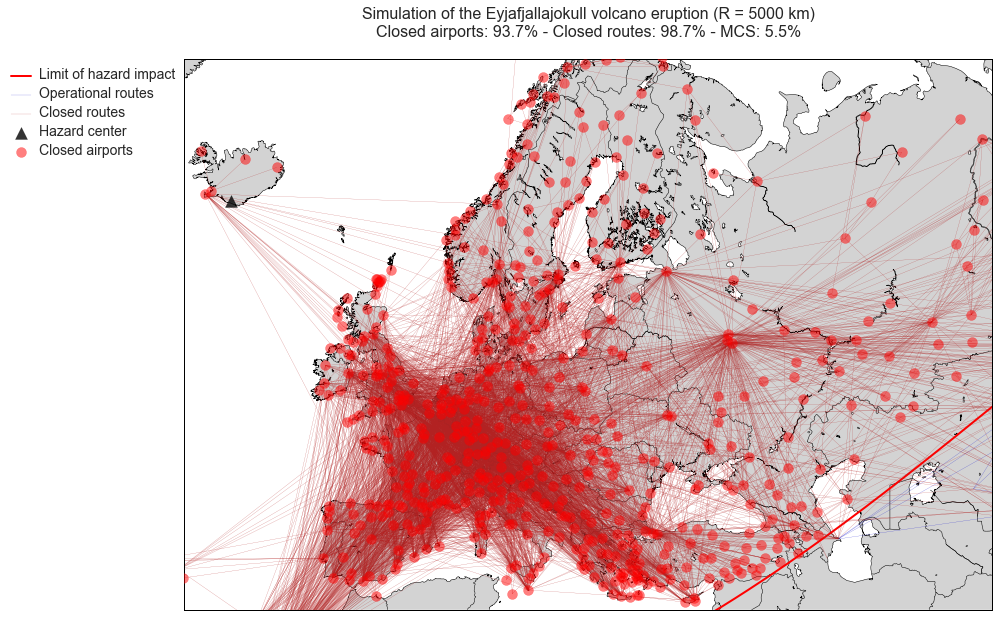

Wall time: 8min 58s


In [123]:
# Simulation for differents radiuses
plt.style.use("seaborn")

for R in [900, 1500, 2000, 2500, 3000, 3500, 4000, 4500, 5000]:
    
    spatial_hazards.simulate_hazard(lat_volcano, long_volcano, R, verbose=False)
    
    spatial_hazards.plot_hazard(title="Simulation of the Eyjafjallajokull volcano eruption (R = {} km)"\
                                .format(R), 
                                iceland=True,
                                save_fig="volcano_{}km".format(R))

Next, we increase the radius of the ash cloud from $1$ to $5000 km$ (with a step of $10$) and store the different metrics at each iteration (% airports closed, % routes closed, MCS).

In [35]:
plt.style.use("ggplot")

In [36]:
# Multiple random hazards simulations
radii = range(1, 5000, 10)
props_airports_closed_volc = []
props_routes_closed_volc = []
props_size_gcc_volc = []

for radius in tqdm(radii):
    prop_airports_closed, prop_routes_closed, prop_size_gcc = \
                        spatial_hazards.simulate_hazard(lat_volcano, long_volcano, radius)
    props_airports_closed_volc.append(prop_airports_closed)
    props_routes_closed_volc.append(prop_routes_closed)
    props_size_gcc_volc.append(prop_size_gcc)

100%|██████████| 500/500 [00:57<00:00, 23.99it/s]


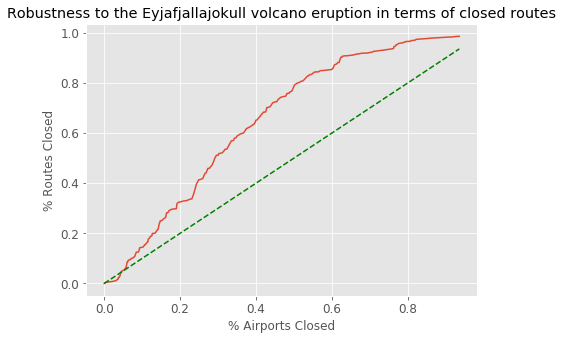

In [37]:
plt.figure(figsize=(7,5))
plt.plot(props_airports_closed_volc, props_routes_closed_volc)
plt.plot(props_airports_closed_volc, props_airports_closed_volc, 'g--')
plt.xlabel("% Airports Closed")
plt.ylabel("% Routes Closed")
plt.title("Robustness to the Eyjafjallajokull volcano eruption in terms of closed routes")
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.show()

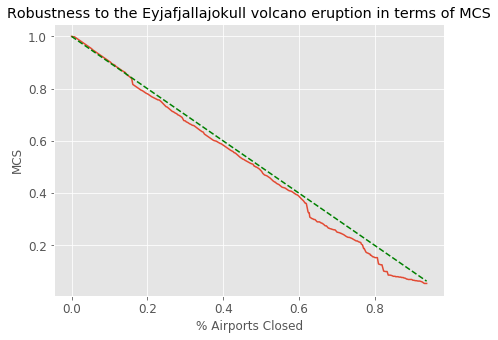

In [38]:
plt.figure(figsize=(7,5))
plt.plot(props_airports_closed_volc, props_size_gcc_volc)
plt.plot(props_airports_closed_volc, [1-prop for prop in props_airports_closed_volc], "g--")
plt.xlabel("% Airports Closed")
plt.ylabel("MCS")
plt.title("Robustness to the Eyjafjallajokull volcano eruption in terms of MCS")
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.show()

Let's see how the % of Airports Closed grows with the radius:

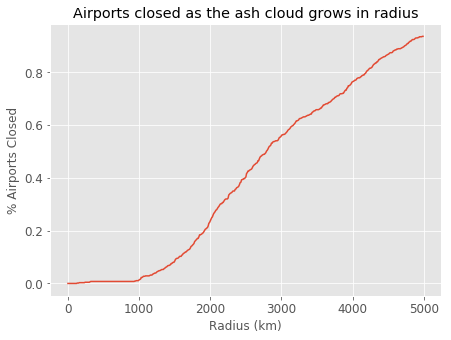

In [39]:
plt.figure(figsize=(7,5))
plt.plot(radii, props_airports_closed_volc)
plt.xlabel("Radius (km)")
plt.ylabel("% Airports Closed")
plt.title("Airports closed as the ash cloud grows in radius")
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.show()

## Amsterdam terrorist attack

We simulate a terrorist attack occuring at one specific airport. We chose Amsterdam, which is the most connected in Europe in terms of incoming and outgoing flights, $150$ and $151$ respectively.

In [40]:
# Latitude and longitude of AMS
lat_ams = df_airports_eur.loc["AMS"]["latitude"]
long_ams = df_airports_eur.loc["AMS"]["longitude"]

# Radius of impact (1 so that no other airport is shut down by the simulation)
R = 1

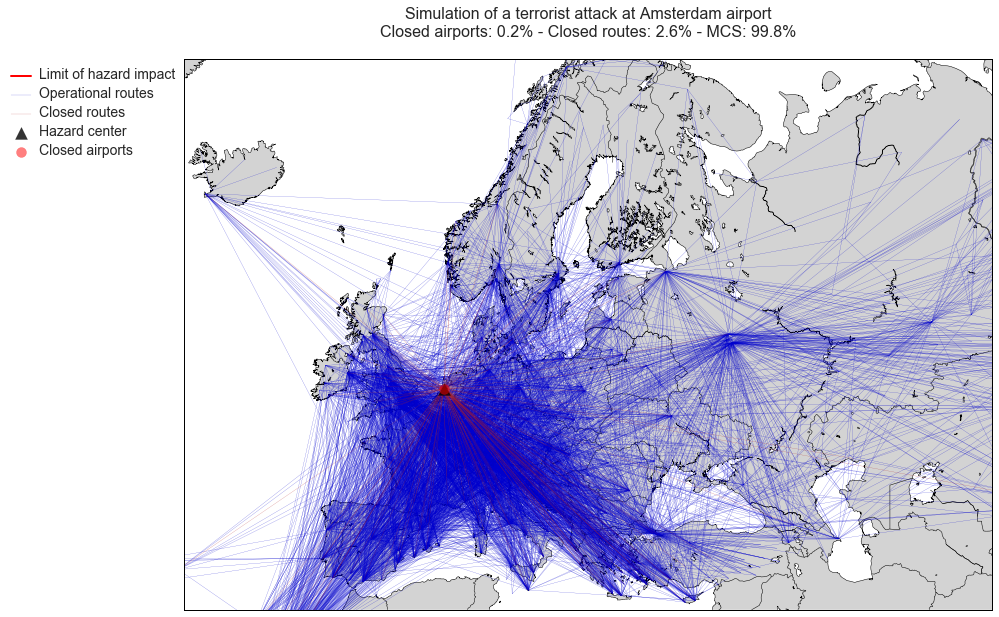

In [42]:
# Simulation
plt.style.use("seaborn")
spatial_hazards.simulate_hazard(lat=lat_ams, lng=long_ams, rad=R, verbose=False)

spatial_hazards.plot_hazard(title="Simulation of a terrorist attack at Amsterdam airport", 
                            iceland=True,
                            save_fig="ams".format(R))

## Impact of random hazards in Europe
We simulate $N$ hazards with random centers across Europe, and random radiuses (between $1$ and $5000 km$) in order to assess the global robustness of the European air traffic network.

In [43]:
n_hazard = 500
props_airports_closed = []
props_routes_closed = []
props_size_gcc = []

for _ in tqdm(range(n_hazard)):
    prop_airports_closed, prop_routes_closed, prop_size_gcc = spatial_hazards\
                            .simulate_hazard()
    props_airports_closed.append(prop_airports_closed)
    props_routes_closed.append(prop_routes_closed)
    props_size_gcc.append(prop_size_gcc)

100%|██████████| 500/500 [00:39<00:00, 12.55it/s]


### % Routes closed - % Airports closed

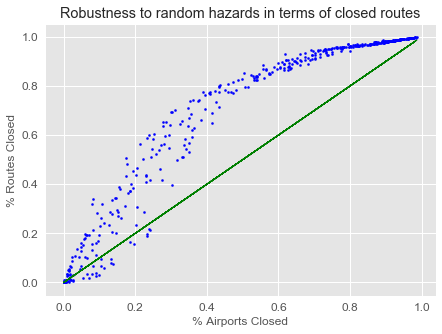

In [44]:
plt.style.use("ggplot")
plt.figure(figsize=(7,5))
plt.scatter(props_airports_closed, props_routes_closed, s=2**2, c="b")
plt.plot(props_airports_closed, props_airports_closed, 'g--', linewidth=1)
plt.xlabel("% Airports Closed")
plt.ylabel("% Routes Closed")
plt.title("Robustness to random hazards in terms of closed routes")
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.show()

### Example of non damaging hazard

Non damaging hazards are the points located under the $45°$ lines above (few routes closed compared to the airports closed).

In [48]:
unrobust_points = spatial_hazards.unrobust_points
unrobust_point = random.choice(unrobust_points)

In [49]:
# Coordinates and radius of the random hazard that did not affect much the
# network
lat_hazard = unrobust_point[0]
long_hazard = unrobust_point[1]
R = unrobust_point[2]

In [50]:
# Simulate the random hazard that did not affect much the network
spatial_hazards.simulate_hazard(lat_hazard, long_hazard, R, verbose=True)

Proportion of closed airports: 11.178%
Proportion of cancelled routes: 5.749%
new GCC size / initial GCC size: 88.754%


(0.11178247734138973, 0.05748663101604278, 0.8875379939209727)

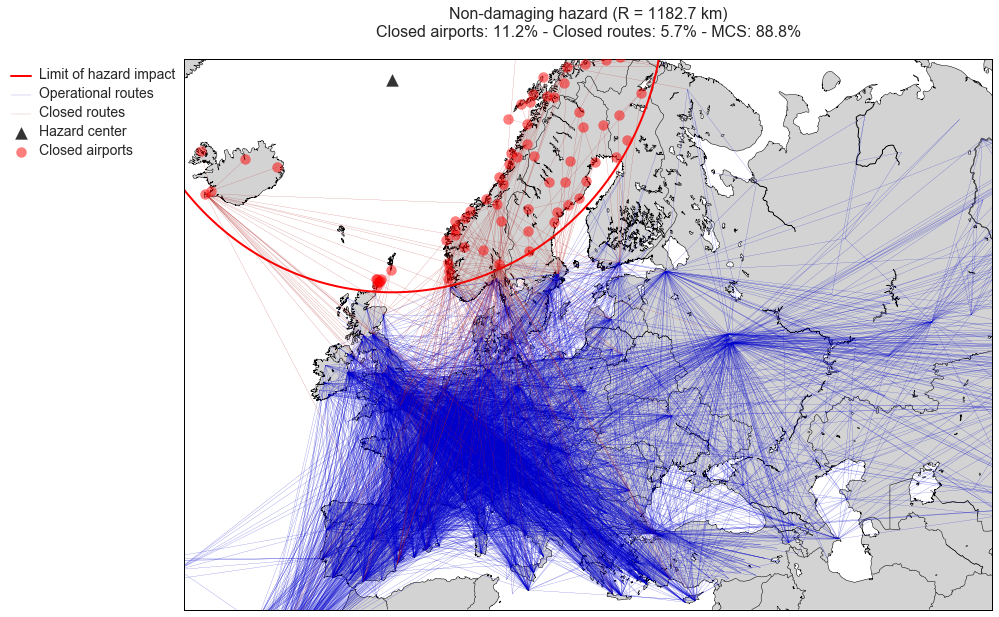

In [51]:
# Plot the hazard
plt.style.use("seaborn")
spatial_hazards.plot_hazard(title="Non-damaging hazard (R = {:0.1f} km)".format(R), 
                            iceland=True,
                            save_fig="non-damaging-hazard")

> Most of the non damaging hazards occur in the ocean and are thus far from the European hubs. That's why they not affect much the network.

### Example of damaging hazard 

Damaging hazards are the points located above the $45°$ line in the previous plot (many routes closed compared to the airports closed).

In [52]:
robust_points = spatial_hazards.robust_points
robust_point = random.choice(robust_points)

In [53]:
# Coordinates and radius of the random hazard that affected a lot the
# network
lat_hazard = robust_point[0]
long_hazard = robust_point[1]
R = robust_point[2]

In [54]:
# Simulate the random hazard that affected a lot the network
spatial_hazards.simulate_hazard(lat_hazard, long_hazard, R, verbose=True)

Proportion of closed airports: 50.453%
Proportion of cancelled routes: 85.094%
new GCC size / initial GCC size: 43.769%


(0.5045317220543807, 0.8509358288770054, 0.4376899696048632)

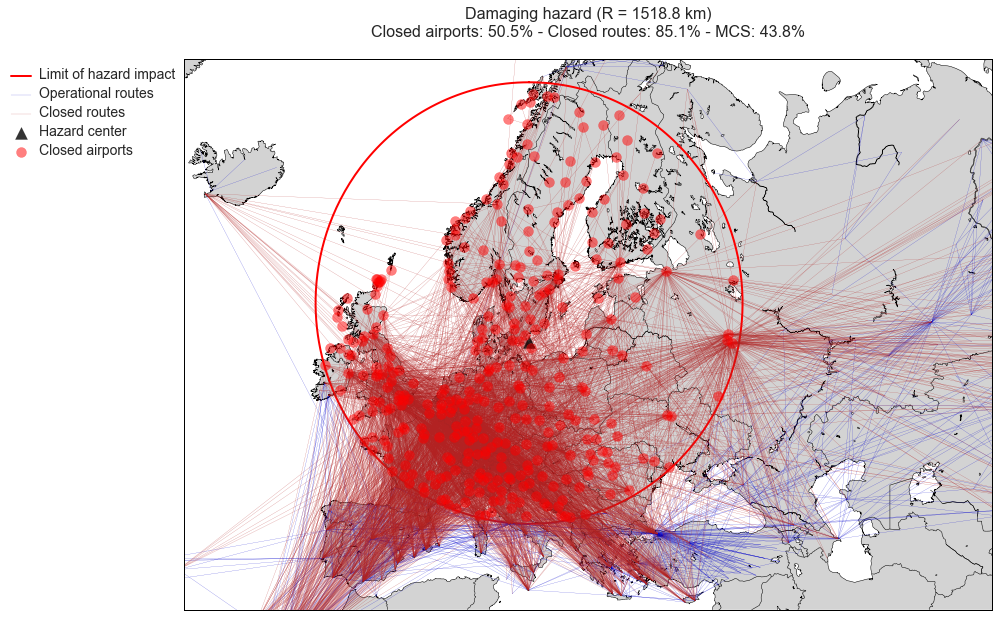

In [55]:
# Plot the hazard
plt.style.use("seaborn")
spatial_hazards.plot_hazard(title="Damaging hazard (R = {:0.1f} km)".format(R), 
                            iceland=True,
                            save_fig="damaging-hazard")

> The damaging hazard in central geographically and shuts down most of the European hubs which explains the fact that the % of closed routes is almost twice the % closed airports.

### MCS / % Airports closed 

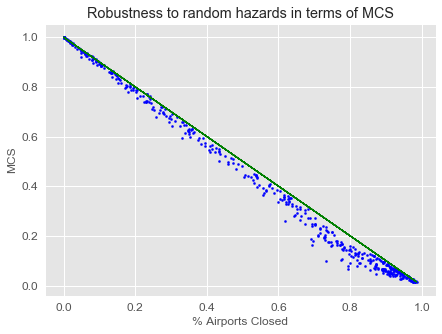

In [56]:
plt.style.use("ggplot")
plt.figure(figsize=(7,5))
plt.scatter(props_airports_closed, props_size_gcc, s=2**2, c="b")
plt.plot(props_airports_closed, [1-prop for prop in props_airports_closed], "g--",
         linewidth=1)
plt.xlabel("% Airports Closed")
plt.ylabel("MCS")
plt.title("Robustness to random hazards in terms of MCS")
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.show()

# Comparison of different air traffic network

In this section we compare different air traffic networks:
- The **European air traffic network**
- The **US air traffic network**
- A **Random European network**: we keep the exact same nodes as for the European Network. For each possible pair, with probability $p=0.025$ an edge between the nodes is created. This probability has been chosen so that the total number of edges is approximately the same as the European Network

## US network

In this section, we do exactly the same processing as the European air traffic network.


In [57]:
df_airports_us = df_airports[df_airports["country"] =='United States']

In [58]:
# Take only the routes intra us 
airports_us = list(df_airports_us['IATA'].unique())
df_us = df[(df['source_airport'].isin(airports_us)) & (df['destination_airport'].isin(airports_us))]
df_us.head()
print("There are {} airports in the US".format(len(airports_us)))

There are 1334 airports in the US


In [59]:
# Preprocessing
df_us_processed = preprocess(df_us)
df_us_processed.shape

(5439, 2)

In [60]:
airport_us_iata_ids = list(df_us_processed.source_airport\
                            .append(df_us_processed.destination_airport).unique())
n_unique_airports = len(airport_us_iata_ids)

print("There are {} unique airports in the US".format(n_unique_airports))

There are 546 unique airports in the US


We will reduce the airports table to these 546 airports:

In [61]:
df_airports_us = df_airports_us[df_airports_us.IATA.isin(airport_us_iata_ids)]

In [62]:
# Create the undirected graph
arr_edges = np.array(df_us_processed)
G = nx.Graph()
G.add_edges_from(arr_edges)
n_edges = len(G.edges())
print("There are {} bidirectional routes".format(n_edges))

There are 2781 bidirectional routes


In [63]:
# Basic statistics
print("#Routes: {}".format(df_us_processed.shape[0]))
print("#Unique Source Airports: {}".format(df_us_processed.source_airport.nunique()))
print("#Unique Target Airports: {}".format(df_us_processed.destination_airport.nunique()))
nodes = np.unique(np.concatenate([df_us_processed.source_airport, df_us_processed.destination_airport]))
print("#Nodes: {}".format(len(nodes)))

#Routes: 5439
#Unique Source Airports: 540
#Unique Target Airports: 538
#Nodes: 546


In [64]:
# Create the simulation object
spatial_hazards_us = SpatialHazards(df_airports_us, df_us_processed)

Number of initial airports: 546
Number of initial routes: 2781
Number of airports in the GCC initially: 539


In [65]:
# Simulate random hazards the same way as before
n_hazard = 500
props_airports_closed_us = []
props_routes_closed_us = []
props_size_gcc_us = []

for _ in tqdm(range(n_hazard)):
    prop_airports_closed, prop_routes_closed, prop_size_gcc = spatial_hazards_us\
                            .simulate_hazard(region = "US")
    props_airports_closed_us.append(prop_airports_closed)
    props_routes_closed_us.append(prop_routes_closed)
    props_size_gcc_us.append(prop_size_gcc)

100%|██████████| 500/500 [00:34<00:00, 14.29it/s]


## Random graph

In this section, we model a random graph from the European air traffic network. We keep the same nodes and place routes randomly with probability $0.025$ (probability that gives us the same number of edges as the real network).

In [66]:
def random_edges_from_nodes(list_nodes, p):
    list_random_edges = [] 
    n = len(list_nodes)
    for i in range(n):
        source = list_nodes[i]
        for j in range(i+1, n):
            rd = random.random()
            if rd <= p:
                target = list_nodes[j]
                list_random_edges.append([source, target])
    print("Number of edges in the random graph: {}".format(len(list_random_edges)))
    return pd.DataFrame(list_random_edges, columns=["source_airport", "destination_airport"])

In [67]:
# Routes of the Random European network
df_random_routes = random_edges_from_nodes(airport_eur_iata_ids, p=0.025)

Number of edges in the random graph: 5485


In [68]:
# Create the simulation object
spatial_hazards_random_routes = SpatialHazards(df_airports_eur, df_random_routes)

Number of initial airports: 662
Number of initial routes: 5485
Number of airports in the GCC initially: 662


In [69]:
# Simulate random hazards the same way as before
n_hazard = 500
props_airports_closed_random = []
props_routes_closed_random = []
props_size_gcc_random = []

for _ in tqdm(range(n_hazard)):
    prop_airports_closed, prop_routes_closed, prop_size_gcc = spatial_hazards_random_routes\
                            .simulate_hazard()
    props_airports_closed_random.append(prop_airports_closed)
    props_routes_closed_random.append(prop_routes_closed)
    props_size_gcc_random.append(prop_size_gcc)

100%|██████████| 500/500 [00:33<00:00, 13.53it/s]


## Robustness comparison

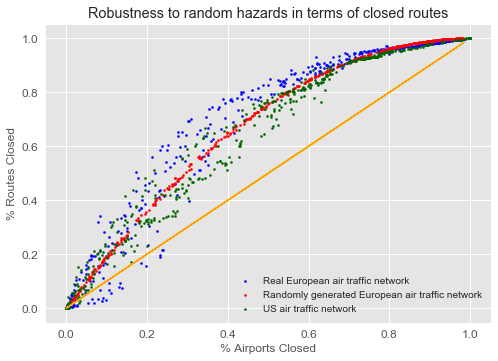

In [70]:
plt.plot(props_airports_closed, props_airports_closed, 'g--', linewidth=1.0, 
         c="orange")
plt.scatter(props_airports_closed, props_routes_closed, 
            label="Real European air traffic network", s=2**2, c="b")
plt.scatter(props_airports_closed_random, props_routes_closed_random, 
            label="Randomly generated European air traffic network", s=2**2,
            c="r")
plt.scatter(props_airports_closed_us, props_routes_closed_us, 
            label="US air traffic network", s=2**2, 
            c="darkgreen")
plt.xlabel("% Airports Closed")
plt.ylabel("% Routes Closed")
plt.title("Robustness to random hazards in terms of closed routes")
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.legend()
plt.show()

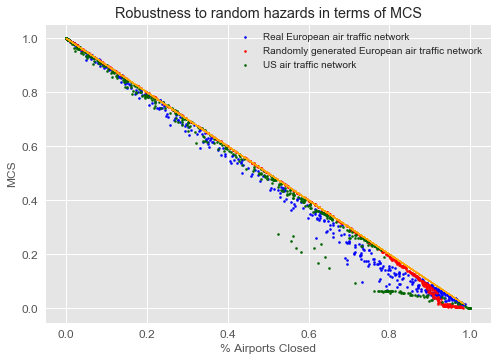

In [71]:
plt.scatter(props_airports_closed, props_size_gcc, 
            label="Real European air traffic network", s=2**2,
            c="b")
plt.scatter(props_airports_closed_random, props_size_gcc_random,
            label="Randomly generated European air traffic network", s=2**2,
            c="r")
plt.scatter(props_airports_closed_us, props_size_gcc_us,
            label="US air traffic network", s=2**2, c="darkgreen")
plt.plot(props_airports_closed, [1-prop for prop in props_airports_closed], "g--",
         linewidth=1.0, c="orange")
plt.xlabel("% Airports Closed")
plt.ylabel("MCS")
plt.title("Robustness to random hazards in terms of MCS")
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.legend()
plt.show()